This notebook aims to compare the TROPOMI NO2 column density and yearly NOx emissions of soil, anthropogenic, shipping, wildfire, and lightning sources.

- TROPOMI mean NO2 data

    - s5p_no2_PAL_v231_gridding_2x2_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc
    - s5p_no2_PAL_v231_gridding_4x4_snowcorr3_JJA_19_20_21.nc
    - regrid_no2_stats_qa75.nc (generated by [s5p_regrid_combine.py](https://github.com/zxdawn/S5P-LNO2/blob/main/main/s5p_regrid_combine.py))

    Default PAL v2.3.1 run:
    qa_value > 0.75 corresponds to scene_pressure > 0.98 * surface_pressure

    "snowcorrection"
        scene_pressure > 0.96 * surface_pressure

    "snowcorr2"
        scene_pressure > 0.94 * surface_pressure

    "snowcorr3"
        scene_pressure > 0.90 * surface_pressure

- soil, ship, and anthro: [CAMS](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-global-emission-inventories?tab=form)

    - CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018.nc
    - CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018.nc
    - CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc


- wildfire: [CAMS global biomass burning emissions based on fire radiative power (GFAS)](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-global-fire-emissions-gfas)

    - gfas_2019.nc, gfas_2020.nc, gfas_2021.nc

- lightning: gridded lightning NO2 product

    - S5P_LNO2_grid.nc generated by [`s5p_lno2_grid.py`](https://github.com/zxdawn/S5P-LNO2/blob/main/main/s5p_lno2_grid.py)

The area files are generated by `cdo gridarea <input.nc> <output.nc>`

- CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018_area.nc
- CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018_area.nc
- gfas_2018_area.nc
- LNO2_emiss_area.nc

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import proplot as pplt
from scipy import stats
from glob import glob

from shapely.prepared import prep
import cartopy.io.shapereader as shpreader
from shapely.ops import unary_union
import shapely.vectorized
from matplotlib.colors import LogNorm

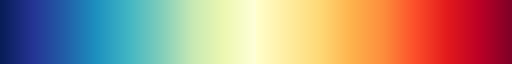

In [2]:
# create colormap
cmap = pplt.Colormap('YlGnBu_r', 'YlOrRd', ratios=(1, 1), name='tropomi_no2')
cmap

## Read VIIRS widlfire data

In [3]:
df_viirs = pd.concat(pd.read_csv(f, dtype={'acq_time': 'str'}) for f in glob('../data/viirs/*csv'))

In [4]:
# regrid to 0.1*0.1 deg grid
lon_resolution = 0.1
lat_resolution = 0.1
lon_bnd = np.arange(-180, 180+lon_resolution, lon_resolution)
lat_bnd = np.arange(60, 90+lat_resolution, lat_resolution)
lon_center = np.convolve(lon_bnd, np.ones(2), 'valid') / 2
lat_center = np.convolve(lat_bnd, np.ones(2), 'valid') / 2

fire_count = stats.binned_statistic_2d(df_viirs['latitude'], df_viirs['longitude'], None,
                                            'count', bins=[lat_bnd,lon_bnd]).statistic

fire_count = xr.DataArray(fire_count, dims=['latitude', 'longitude'], coords=[lat_center, lon_center]).rename('fire_count')

In [5]:
fire_count_stacked = fire_count.where(fire_count>300).stack(x=['longitude','latitude'])
lon_fire = fire_count_stacked[fire_count_stacked.notnull()]['longitude']
lat_fire = fire_count_stacked[fire_count_stacked.notnull()]['latitude']

## TROPOMI VCDs

### Regrid mean NO2 VCD

#### Comparisons of different snow-cloud filters

In [6]:
# scene_pressure > 0.96 * surface_pressure
vcd_regrid_xin = xr.open_dataset('../data/tropomi_regrid_combine/regrid_no2_stats_qa75.nc')['vcd_mean']
vcd_regrid_xin = vcd_regrid_xin.where(vcd_regrid_xin.coords['latitude']>=60, drop=True)

# scene_pressure > 0.96 * surface_pressure
vcd_regrid_98 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_2x2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_98 = vcd_regrid_98.where(vcd_regrid_98.coords['lat']>=60, drop=True)

# scene_pressure > 0.96 * surface_pressure
vcd_regrid_96 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_96 = vcd_regrid_96.where(vcd_regrid_96.coords['lat']>=60, drop=True)

# scene_pressure > 0.94 * surface_pressure
vcd_regrid_94 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_94 = vcd_regrid_94.where(vcd_regrid_94.coords['lat']>=60, drop=True)

# scene_pressure > 0.90 * surface_pressure
vcd_regrid_90 = xr.open_dataset('../data/tropomi_regrid_combine/s5p_no2_PAL_v231_gridding_4x4_snowcorr2_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
vcd_regrid_90 = vcd_regrid_90.where(vcd_regrid_90.coords['lat']>=60, drop=True)

In [7]:
vcd_regrid_96

<xarray.DataArray 'no2_vcd_trop_gridded' (lat: 720, lon: 8640)>
array([[5.5976324, 6.038286 , 5.969272 , ..., 7.036132 , 6.9295983,
        5.963262 ],
       [5.928887 , 5.974353 , 6.424834 , ..., 6.885785 , 6.330124 ,
        5.85817  ],
       [6.0812078, 6.388563 , 6.4328794, ..., 7.9037943, 6.386326 ,
        6.6854534],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
  * lat      (lat) float32 60.02 60.06 60.1 60.15 ... 89.85 89.9 89.94 89.98
  * lon      (lon) float32 -180.0 -179.9 -179.9 -179.9 ... 179.9 179.9 180.0
Attributes:
    standard_name:  nitrogen_dioxide_vcd_trop_gridded
    long_name:      NO2 tropospheric column gridded mean, TROPOMI sensor
    units:          1e-6 mol m^-2

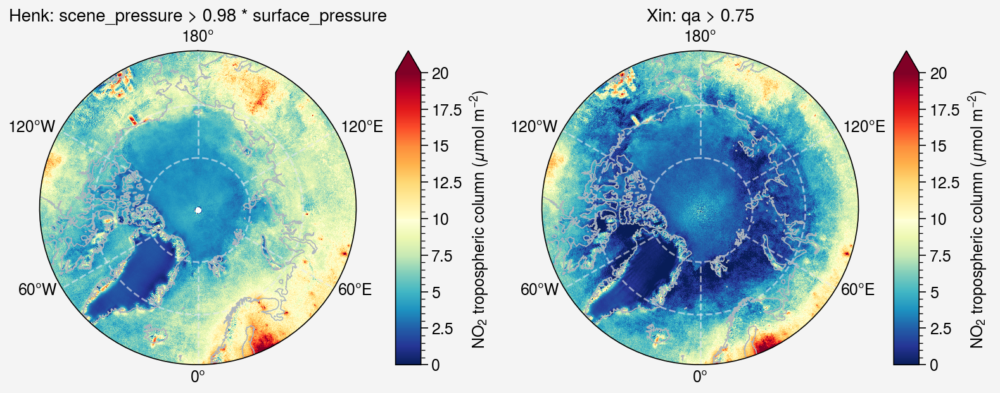

In [8]:
fig, axs = pplt.subplots(proj='npstere', ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False, extend='max')
ax.format(title='Henk: scene_pressure > 0.98 * surface_pressure')
ax.colorbar([m], loc='r', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')


ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_xin['longitude'], vcd_regrid_xin['latitude'])
m = ax.pcolormesh(lons, lats, vcd_regrid_xin, cmap=cmap, vmin=0, vmax=20, discrete=False, extend='max')
ax.format(title='Xin: qa > 0.75')
ax.colorbar([m], loc='r', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

# fig.savefig('../figures/no2_mean_comp_2.jpg')

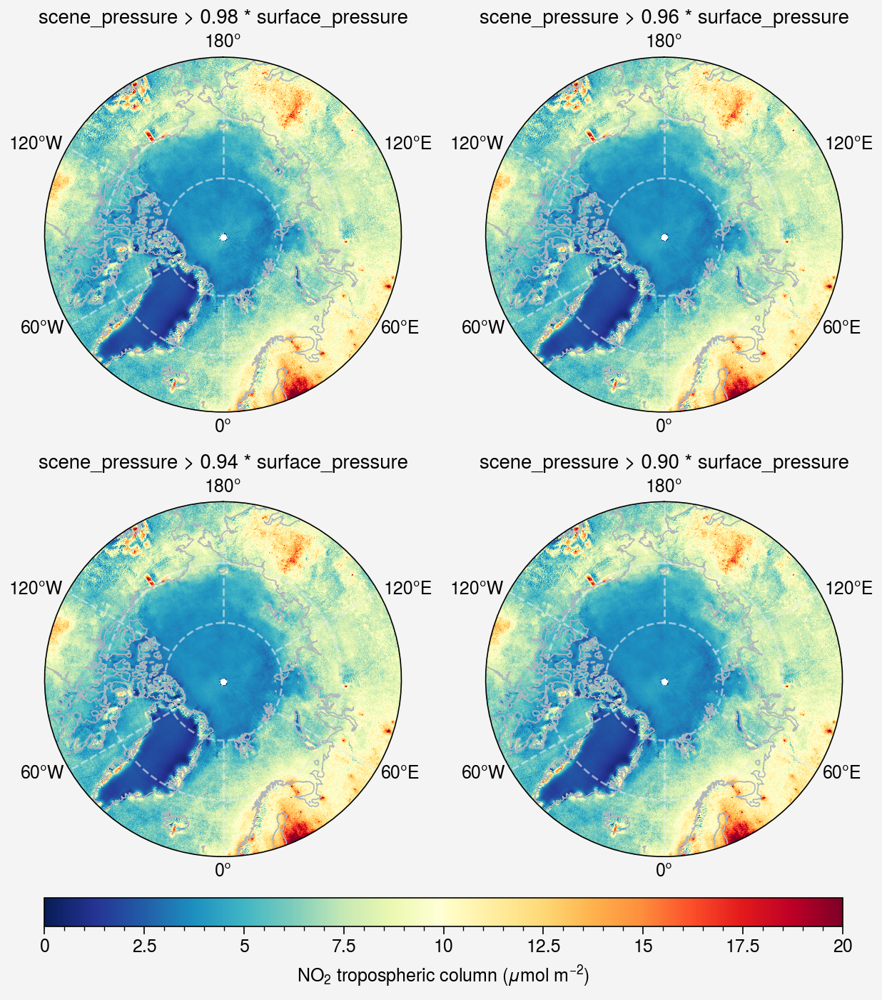

In [9]:
fig, axs = pplt.subplots(proj='npstere', nrows=2, ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.98 * surface_pressure')
# ax.colorbar([m], loc='l', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_96['lon'], vcd_regrid_96['lat'])
vcd_regrid_98_coarsen = vcd_regrid_98.coarsen(lat=2, lon=2).mean().values
m = ax.pcolormesh(lons, lats, vcd_regrid_96, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.96 * surface_pressure')

ax = axs[2]
lons, lats = np.meshgrid(vcd_regrid_94['lon'], vcd_regrid_94['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_94, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.94 * surface_pressure')

ax = axs[3]
lons, lats = np.meshgrid(vcd_regrid_90['lon'], vcd_regrid_90['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_90, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.90 * surface_pressure')

fig.colorbar([m], loc='b', label=r'NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

# fig.savefig('../figures/no2_mean_comp.jpg')

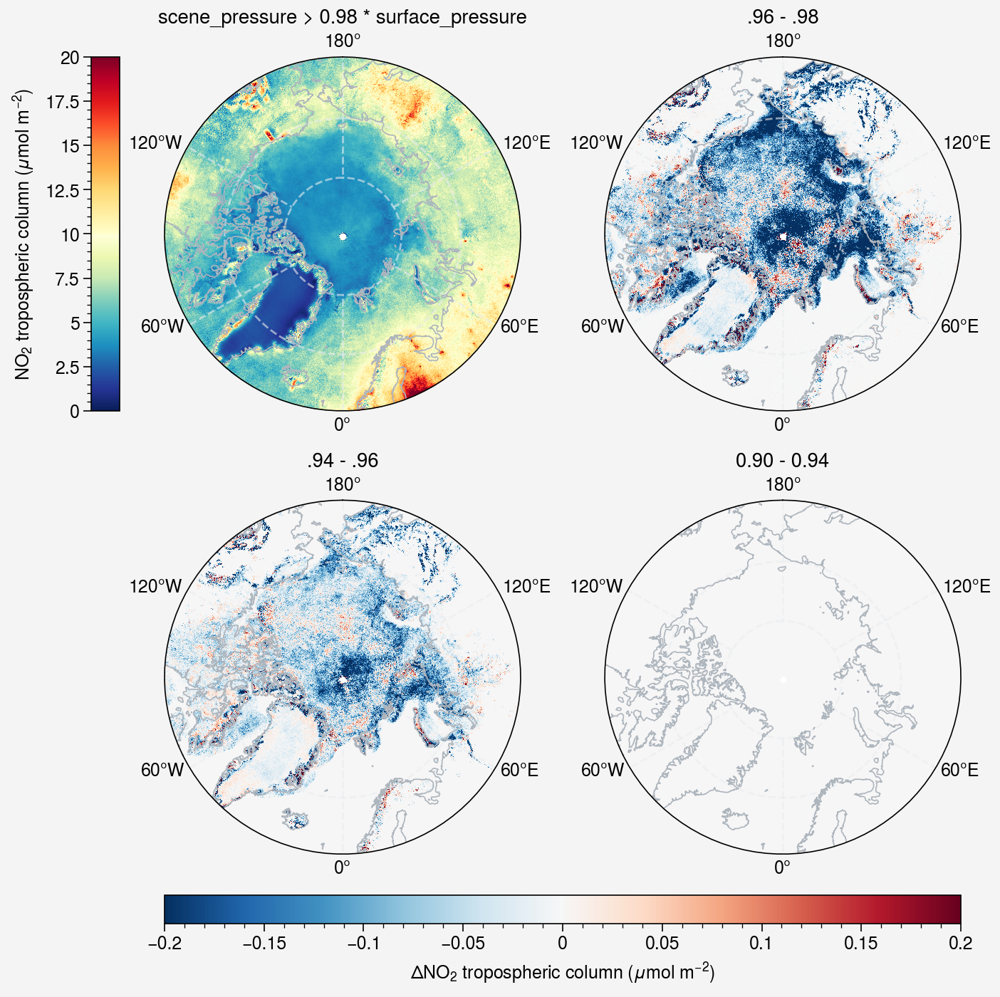

In [10]:
fig, axs = pplt.subplots(proj='npstere', nrows=2, ncols=2)

axs.format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
lons, lats = np.meshgrid(vcd_regrid_98['lon'], vcd_regrid_98['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_98, cmap=cmap, vmin=0, vmax=20, discrete=False)
ax.format(title='scene_pressure > 0.98 * surface_pressure')
ax.colorbar([m], loc='l', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

ax = axs[1]
lons, lats = np.meshgrid(vcd_regrid_96['lon'], vcd_regrid_96['lat'])
vcd_regrid_98_coarsen = vcd_regrid_98.coarsen(lat=2, lon=2).mean().values
m = ax.pcolormesh(lons, lats, vcd_regrid_96-vcd_regrid_98_coarsen, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='.96 - .98')

ax = axs[2]
lons, lats = np.meshgrid(vcd_regrid_94['lon'], vcd_regrid_94['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_94-vcd_regrid_96, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='.94 - .96')

ax = axs[3]
lons, lats = np.meshgrid(vcd_regrid_90['lon'], vcd_regrid_90['lat'])
m = ax.pcolormesh(lons, lats, vcd_regrid_90-vcd_regrid_94, vmin=-0.2, vmax=0.2, discrete=False)
ax.format(title='0.90 - 0.94')

fig.colorbar([m], loc='b', label=r'$\Delta$NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')

# fig.savefig('../figures/no2_mean_comp_1.jpg')

Because the snow-cloud filter affects the mean VCD very little, we choose `scene_pressure > 0.96 * surface_pressure` as the final one.

In [11]:
# vcd_regrid = xr.open_dataset('../data/tropomi_regrid/s5p_no2_PAL_v231_gridding_4x4_snowcorr1_JJA_19_20_21.nc')['no2_vcd_trop_gridded']
# vcd_regrid = vcd_regrid.where(vcd_regrid.coords['lat']>=60, drop=True)#.plot(x='lon', vmin=0, vmax=30)##.coarsen(lon=5, lat=5).mean()

vcd_regrid = vcd_regrid_96

## Pick hotpots of NO2 VCD

In [12]:
def plot_mean_no2(no2, ax):
    lons, lats = np.meshgrid(no2['lon'], no2['lat'])

    m = ax.pcolormesh(lons, lats, no2, cmap=cmap, vmin=0, vmax=20, discrete=False)

    ax.colorbar([m], loc='b', label='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)')
    # ax.format(title='Mean NO$_2$ tropospheric column')

In [13]:
import hvplot.xarray

img = vcd_regrid.hvplot.quadmesh('lon', 'lat', 
# projection='NorthPolarStereo', 
projection='PlateCarree',
cmap='Thermal', rasterize=True, dynamic=False, coastline=True, clim=(0, 20)) #width=400, 

from bokeh import models
hover = models.HoverTool(tooltips=[
    ("lon", "@x"),
    ("lat", "@y"),
     ("test", "@image"),
])

# # hover = models.HoverTool(tooltips=[
# #     ("lon", "@lon"),
# #     ("lat", "@lat"),
# # ])

img.options(tools=[hover])

:Overlay
   .Image.I     :Image   [lon,lat]   (no2_vcd_trop_gridded)
   .Coastline.I :Feature   [Longitude,Latitude]

In [14]:
oil_gas_points = np.array([[-148.6, 70.2], [-144.4, 69.5], [-149.8, 61.2], [129.7, 62], [50.8, 61.8], [53.7, 63.5], [64.2, 67.5], [73.5, 61.2]])
mining_points = np.array([[-145.6, 63.6], [88, 69.5], [76.8, 66],[33.5, 69.2], [34, 67.6], [10.4, 63.4]])

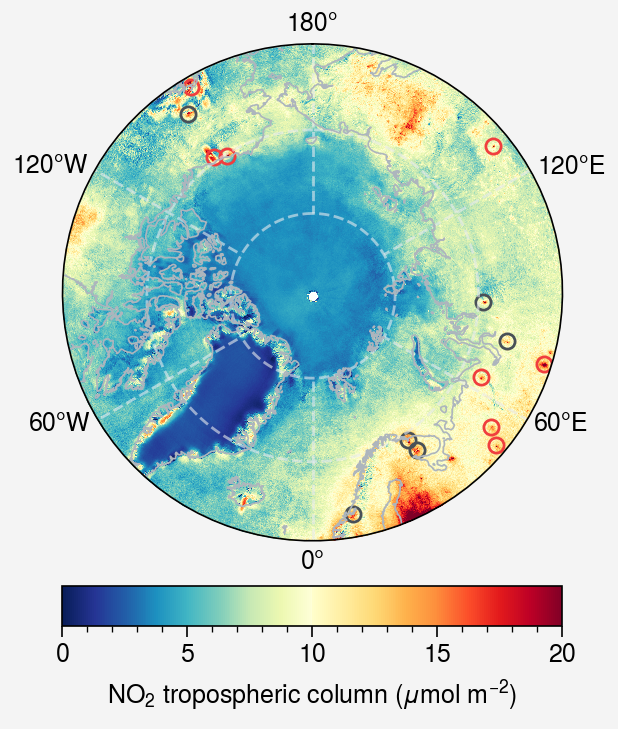

In [15]:
fig, axs = pplt.subplots(proj='npstere')

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')

## Statistics

### Read daily VCD maximum

In [16]:
vcd_max = xr.open_dataset('../data/tropomi_regrid_combine/regrid_no2_stats_qa75.nc')['vcd_max']

### Wildfire NO2

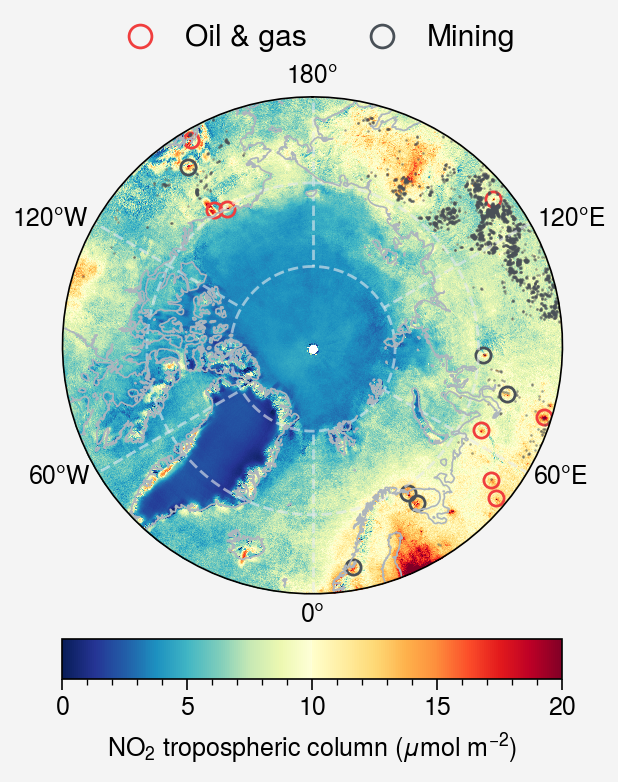

In [17]:
# fig, axs = pplt.subplots(proj=['npstere', None], ncols=2)
fig, axs = pplt.subplots(proj='npstere')

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')
ax.legend(loc='t', frame=False, markerscale=1.5, fontsize='large')
ax.scatter(lon_fire, lat_fire, c='gray7', s=0.1, alpha=0.5)

# fig.savefig('../figures/no2_wildfire.png')

In [18]:
# calculate the daily no2_max for pixels
lat_index, lon_index = np.where(fire_count>300)
fire_vcd = vcd_max.isel(latitude=xr.DataArray(lat_index, dims="loc"), longitude=xr.DataArray(lon_index, dims="loc")).stack(z=("time", "loc"))

oil_gas_vcd = vcd_max.sel(longitude=xr.DataArray(oil_gas_points[:, 0], dims="loc"), latitude=xr.DataArray(oil_gas_points[:, 1], dims="loc"), method='nearest').stack(z=("time", "loc"))
mining_vcd = vcd_max.sel(longitude=xr.DataArray(mining_points[:, 0], dims="loc"), latitude=xr.DataArray(mining_points[:, 1], dims="loc"), method='nearest').stack(z=("time", "loc"))

In [19]:
df_oilgas = pd.DataFrame({'Oil & gas': oil_gas_vcd.where(oil_gas_vcd>0, drop=True)})
df_mining = pd.DataFrame({'Mining': mining_vcd.where(mining_vcd>0, drop=True)})
df_fire = pd.DataFrame({'Fire': fire_vcd.where(fire_vcd>0, drop=True)})

lno2_emiss_pixel = xr.open_dataset('../data/S5P_LNO2_grid.nc')['lno2_max'].max(dim=['longitude', 'latitude'])#.mean(dim='swath')
df_lightning_pixel = pd.DataFrame({'Lightning': lno2_emiss_pixel*1e6})

# df_emiss = pd.concat([df_oilgas, df_mining, df_pipeline, df_lightning_pixel], ignore_index=True, axis=1)
# df_emiss.columns = ['Oil/gas', 'Mining', 'Pipeline', 'Lightning']

df_emiss = pd.concat([df_fire, df_oilgas, df_mining, df_lightning_pixel], ignore_index=True, axis=1)
df_emiss.columns = ['Wildfire', 'Oil & gas', 'Mining', 'Lightning']

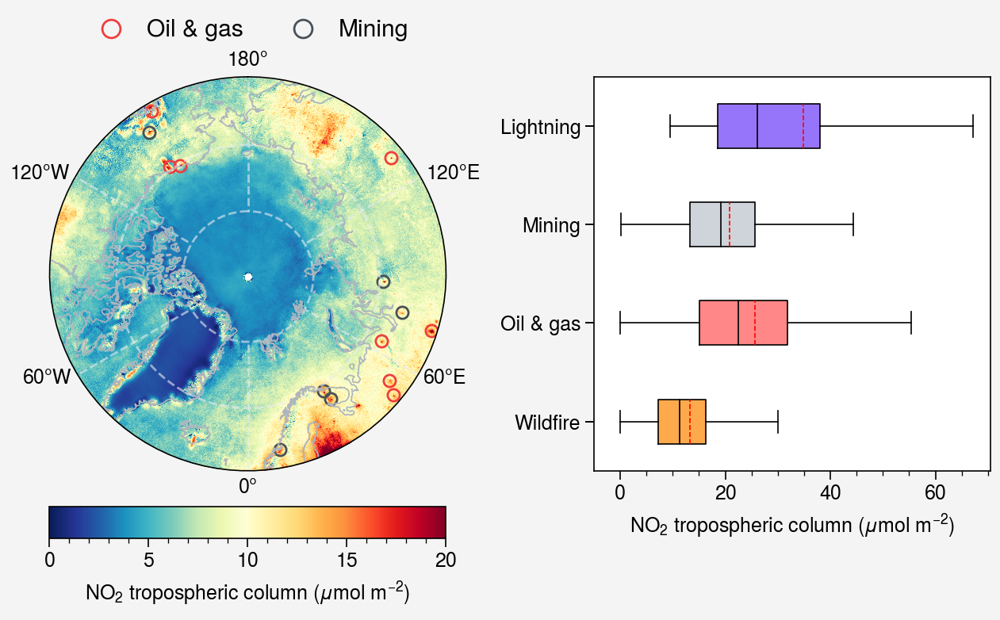

In [20]:
fig, axs = pplt.subplots(proj=['npstere', None], ncols=2)

axs[0].format(boundinglat=60, latlines=10, coast=True, lonlabels='lrbt', coastcolor='gray5', reso='med', gridcolor='gray2', 
gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',)

ax = axs[0]
plot_mean_no2(vcd_regrid, ax)

ax.scatter(oil_gas_points[:, 0], oil_gas_points[:, 1], facecolors='none', edgecolor='red7', edgewidth=1, s=30, label='Oil & gas')
ax.scatter(mining_points[:, 0], mining_points[:, 1], facecolors='none', edgecolor='gray7', edgewidth=1, s=30, label='Mining')
ax.legend(loc='t', frame=False, markerscale=1.5, fontsize='large')


ax = axs[1]
cycle = {'Lightning': 'violet4', 'Oil & gas': 'red4', 'Mining': 'gray4', 'Wildfire': 'orange4'}
cycle = [cycle[x] for x in df_emiss.columns.values]
ax.boxh(df_emiss, means=True, marker='x', meancolor='r', showfliers=False, cycle=cycle) #fillcolor='gray4', 

ax.format(ymargin=0.15, xlabel='NO$_2$ tropospheric column ($\mu$mol m$^{-2}$)', xlim=(-5, None), grid=False)

fig.savefig('../figures/no2_comp.png')

### Anthropogenic NOx

In [21]:
# drop duplicated variabels
# monthly data with units kg m-2 s-1
ds_cams = xr.open_dataset('../data/CAMS/CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018.nc', decode_times=False).drop_vars(['shp', 'ags', 'sum'])

# subset to arctic
ds_cams = ds_cams.assign_coords({'time': pd.date_range('2018-01-01', '2019-01-01', freq='M')})
ds_cams = ds_cams.sel(lat=slice(60, None))

# subset to summer
ds_cams = ds_cams.sel(time=slice('2018-06-01', '2018-09-01'))

In [22]:
# sum into one variable
ds_cams_anthro = ds_cams.to_array().sum("variable")

# m2
area_cams_anthro = xr.open_dataset('../data/CAMS/CAMS-GLOB-ANT_v4.2_nitrogen-oxides_2018_area.nc')['cell_area']


# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_anthro = ds_cams_anthro / 30  * 14

# convert to kg N m-2 mo-1
for t in ds_cams_anthro['time']:
    days = pd.Period(t.dt.strftime('%Y-%m').item(), freq='M').daysinmonth
    seconds = days * 24 * 3600
    ds_cams_anthro.loc[dict(time=t)] *= seconds
ds_cams_anthro = ds_cams_anthro / 3

# sum during summer
ds_cams_anthro = ds_cams_anthro.sum(dim='time')
ds_cams_anthro = ds_cams_anthro.where(ds_cams_anthro>0)

# kg N m-2 -> kg N
# ds_cams_anthro = ds_cams_anthro.where(ds_cams_anthro>0)*area_cams_anthro

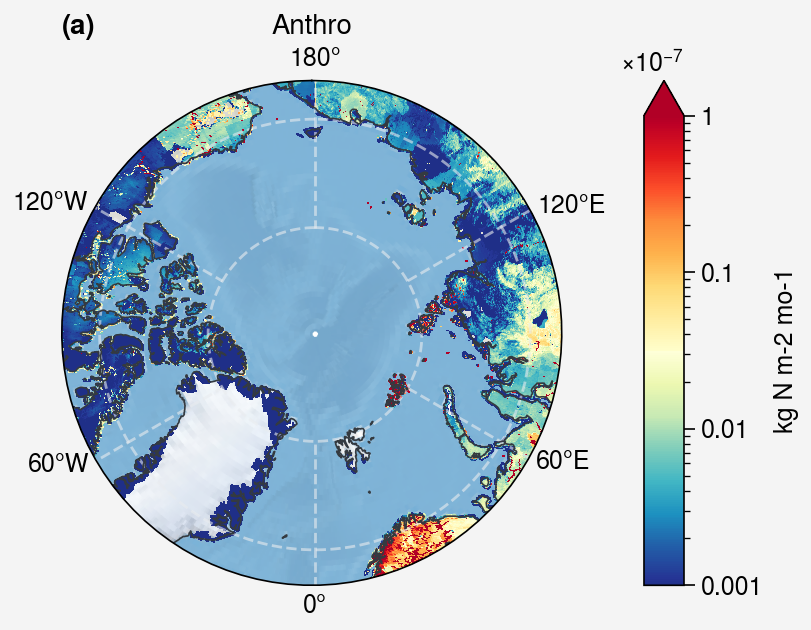

In [23]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# anthro
x, y =  np.meshgrid(ds_cams_anthro['lon'], ds_cams_anthro['lat'])

m = axs.pcolormesh(x, y, ds_cams_anthro, cmap=cmap, discrete=False,
                  vmin=1e-10, vmax=1e-7,
                #   vmin=1e-2, vmax=10,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Anthro')

## Soil NOx

In [24]:
# monthly data with units kg m-2 s-1
ds_cams_soil = xr.open_dataset('../data/CAMS/CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018.nc', decode_times=False)['TotalSoilEmis']

# subset to arctic
ds_cams_soil = ds_cams_soil.assign_coords({'time': pd.date_range('2018-01-01', '2019-01-01', freq='M')})
ds_cams_soil = ds_cams_soil.sel(lat=slice(60, None))

# subset to summer
ds_cams_soil = ds_cams_soil.sel(time=slice('2018-06-01', '2018-09-01'))

In [25]:
ds_cams_soil

<xarray.DataArray 'TotalSoilEmis' (time: 3, lat: 60, lon: 720)>
[129600 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2018-06-30 2018-07-31 2018-08-31
  * lat      (lat) float64 60.25 60.75 61.25 61.75 ... 88.25 88.75 89.25 89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
Attributes:
    Method:                  YLnSMI
    units:                   kg m-2 s-1
    long_name:               Above canopy soil N emissions from  total
    standard_name:           tendency_of_atmosphere_mass_content_of_nox_expre...
    molecular_weight:        30.f
    molecular_weight_units:  g mole-1

In [26]:
# m2
area_cams_soil = xr.open_dataset('../data/CAMS/CAMS-GLOB-SOIL_v2.2_nitrogen-oxides_2018_area.nc')['cell_area']

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_soil = ds_cams_soil / 30  * 14

# convert to kg N m-2 mo-1
for t in ds_cams_soil['time']:
    days = pd.Period(t.dt.strftime('%Y-%m').item(), freq='M').daysinmonth
    seconds = days * 24 * 3600
    ds_cams_soil.loc[dict(time=t)] *= seconds
ds_cams_soil /= 3

# sum during summer
ds_cams_soil = ds_cams_soil.sum(dim='time')
ds_cams_soil.where(ds_cams_soil>0)

# kg N m-2 -> kg N
# ds_cams_soil = ds_cams_soil.where(ds_cams_soil>0)*area_cams_soil

<xarray.DataArray 'TotalSoilEmis' (lat: 60, lon: 720)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * lat      (lat) float64 60.25 60.75 61.25 61.75 ... 88.25 88.75 89.25 89.75
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8

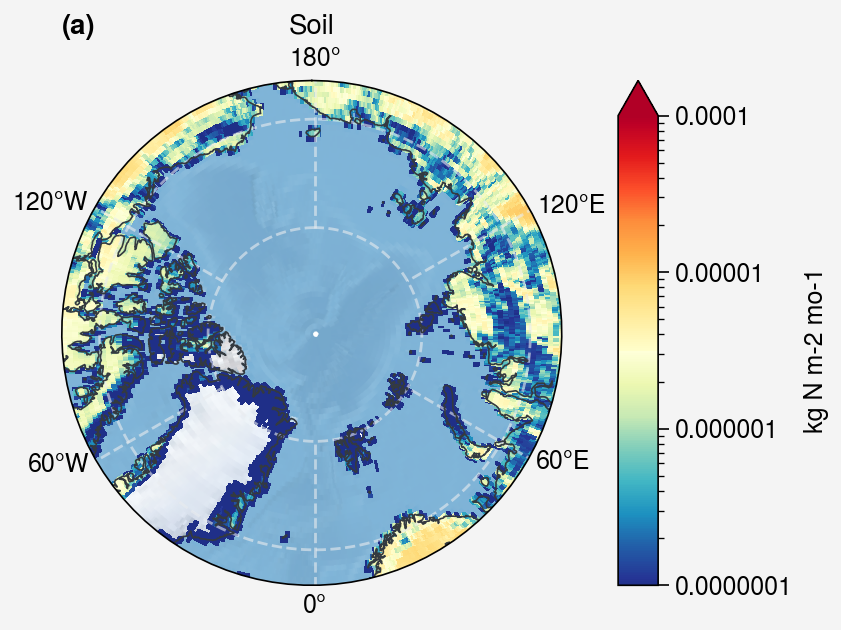

In [27]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# anthro
x, y =  np.meshgrid(ds_cams_soil['lon'], ds_cams_soil['lat'])

m = axs.pcolormesh(x, y, ds_cams_soil, cmap=cmap, discrete=False,
                  vmin=1e-7, vmax=1e-4,
                #   vmin=1e2, vmax=1e5,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Soil')

## Ship NOx

In [28]:
# daily data with units kg m-2 s-1
ds_cams_ship = xr.open_dataset('../data/CAMS/CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc', decode_times=False)['sum']

# # subset to arctic
ds_cams_ship = ds_cams_ship.assign_coords({'time': pd.date_range('2018-01-01', '2018-12-31', freq='D')})
ds_cams_ship = ds_cams_ship.sel(lat=slice(None, 60))

# subset to summer
ds_cams_ship = ds_cams_ship.sel(time=slice('2018-06-01', '2018-08-31'))

In [29]:
ds_cams_ship

<xarray.DataArray 'sum' (time: 92, lat: 121, lon: 1440)>
[16030080 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2018-06-01 2018-06-02 ... 2018-08-31
  * lat      (lat) float32 90.0 89.75 89.5 89.25 89.0 ... 60.75 60.5 60.25 60.0
  * lon      (lon) float32 -180.0 -179.8 -179.5 -179.2 ... 179.2 179.5 179.8
Attributes:
    units:                   kg m-2 s-1
    standard_name:           tendency_of_atmosphere_mass_content_of_nox_expre...
    molecular_weight_units:  g mole-1
    cell_method:             time: sum (interval: 1 year comment: gregorian c...
    long_name:               NOx emissions
    molecular_weight:        30.0

In [30]:
# km2 --> m2
area_cams_ship = xr.open_dataset('../data/CAMS/CAMS-GLOB-SHIP_v2.1_nitrogen-oxides_2018.nc', decode_times=False)['gridcell_area'] *1e6

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_ship = ds_cams_ship / 30  * 14

# convert to kg N m-2 mo-1
ds_cams_ship = ds_cams_ship * 24  * 3600 / 3

# sum during summer
ds_cams_ship = ds_cams_ship.sum(dim='time')
ds_cams_ship = ds_cams_ship.where(ds_cams_ship>0)

# kg N m-2 -> kg N
# ds_cams_ship = ds_cams_ship.where(ds_cams_ship>0)*area_cams_ship

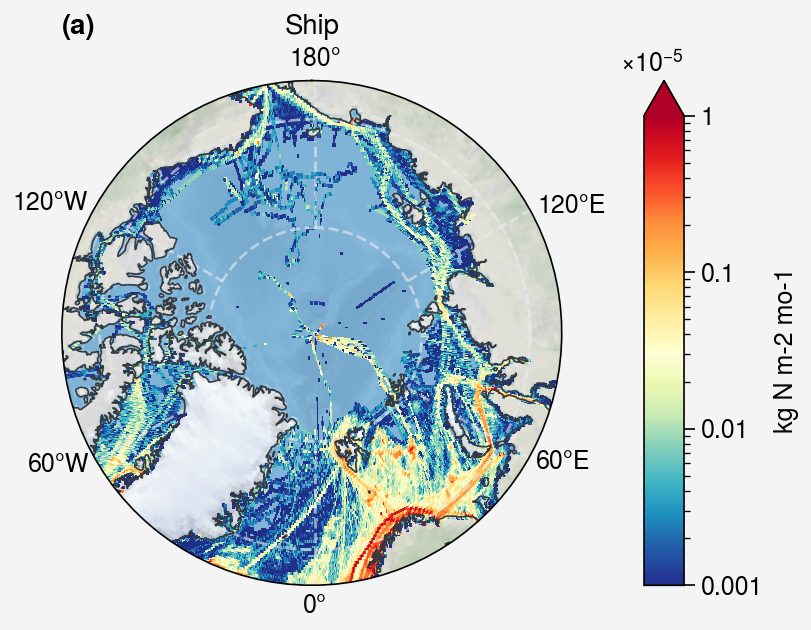

In [31]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# ship
x, y =  np.meshgrid(ds_cams_ship['lon'], ds_cams_ship['lat'])

m = axs.pcolormesh(x, y, ds_cams_ship, cmap=cmap, discrete=False,
                  vmin=1e-8, vmax=1e-5,
                #   vmin=10, vmax=1e4,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Ship')

## Wildfire NOx

In [32]:
xr.open_mfdataset(['../data/GFAS/gfas_2019.nc', '../data/GFAS/gfas_2020.nc', '../data/GFAS/gfas_2021.nc'])['noxfire']

<xarray.DataArray 'noxfire' (time: 276, latitude: 1800, longitude: 3600)>
dask.array<concatenate, shape=(276, 1800, 3600), dtype=float32, chunksize=(92, 1800, 3600), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 0.05 0.15 0.25 0.35 ... 359.8 359.9 360.0
  * latitude   (latitude) float32 89.95 89.85 89.75 ... -89.75 -89.85 -89.95
  * time       (time) datetime64[ns] 2019-06-01 2019-06-02 ... 2021-08-31
Attributes:
    units:      kg m**-2 s**-1
    long_name:  Wildfire flux of Nitrogen Oxides NOx

In [33]:
# daily data with units kg m-2 s-1
# each data is from 06-01 to 08-31
ds_cams_fire = xr.open_mfdataset(['../data/GFAS/gfas_2019.nc', '../data/GFAS/gfas_2020.nc', '../data/GFAS/gfas_2021.nc'])['noxfire']

# subset to arctic
ds_cams_fire = ds_cams_fire.sel(latitude=slice(None, 60))

# m2
area_cams_fire = xr.open_dataset('../data/GFAS/gfas_2018_area.nc', decode_times=False)['cell_area']

# kg m-2 s-1 -> kg N m-2 s-1
ds_cams_fire = ds_cams_fire / 30  * 14

# convert to kg N m-2
ds_cams_fire = ds_cams_fire * 24  * 3600

# sum during summer and calculate the monthly mean
# kg N m-2 --> kg N m-2 mo-1
ds_cams_fire = ds_cams_fire.sum(dim='time') / 9
ds_cams_fire = ds_cams_fire.where(ds_cams_fire>0)

# convert longitude to -180 to 180
ds_cams_fire.coords['longitude'] = (ds_cams_fire.coords['longitude'] + 180) % 360 - 180
ds_cams_fire = ds_cams_fire.sortby(ds_cams_fire.longitude)

In [34]:
ds_cams_fire.load()

<xarray.DataArray 'noxfire' (latitude: 300, longitude: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.9 -179.8 ... 179.8 179.9 180.0
  * latitude   (latitude) float32 89.95 89.85 89.75 89.65 ... 60.25 60.15 60.05

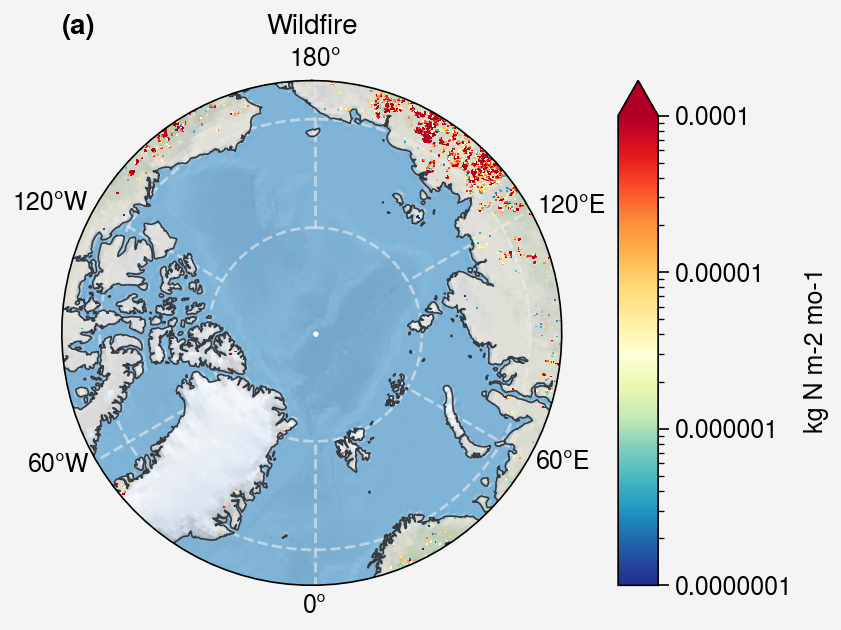

In [35]:
fig, axs = pplt.subplots(proj='npstere')

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()


# ship
x, y =  np.meshgrid(ds_cams_fire['longitude'], ds_cams_fire['latitude'])

m = axs.pcolormesh(x, y, ds_cams_fire, cmap=cmap, discrete=False,
                  vmin=1e-7, vmax=1e-4,
                #   vmin=10, vmax=1e4,
                  extend='max',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )

axs.colorbar([m], loc='r', label='kg N m-2 mo-1')
axs.format(title='Wildfire')

## Lightning NOx

In [36]:
df_lightning = pd.read_csv('../data/gld360/gld-stroke-count-m0p1.csv')
df_lightning.set_index(['time'], inplace=True)
df_lightning.index = pd.to_datetime(df_lightning.index)

# corrected by detection efficiency and IC:CG ratio (~1)
df_lightning['eventCount'] *= 4

# assign the count to new column
df_lightning['lno2'] = df_lightning['eventCount']

# subset to summer
df_lightning = df_lightning[df_lightning.index.month.isin([6,7,8])]

In [37]:
def get_geom(name, category='physical', resolution='50m'):
    # https://stackoverflow.com/questions/47894513/
    #    checking-if-a-geocoordinate-point-is-land-or-ocean-with-cartopy
    shp_fname = shpreader.natural_earth(name=name,
                                        resolution=resolution,
                                        category=category
                                       )
    if name == 'coastline':
        # https://shapely.readthedocs.io/en/stable/manual.html#object.buffer
        geom = unary_union(list(shpreader.Reader(shp_fname).geometries())).buffer(0.5)
    else:
        geom = unary_union(list(shpreader.Reader(shp_fname).geometries()))

    return prep(geom)

In [38]:
land_geom = get_geom('land')
coast_geom = get_geom('coastline')
ocean_geom = get_geom('ocean')

In [39]:
# check which region in which the lightning is located
cond_coast = shapely.vectorized.contains(coast_geom, df_lightning['longitude'], df_lightning['latitude'])
cond_land = shapely.vectorized.contains(land_geom, df_lightning['longitude'], df_lightning['latitude'])
cond_ocean = shapely.vectorized.contains(ocean_geom, df_lightning['longitude'], df_lightning['latitude'])

region = np.argmax(np.vstack((cond_coast, cond_land, cond_ocean))==1, axis=0)
df_lightning['region'] = region

In [40]:
# copied from the `distribution_emission` notebook
pe_lno2_coast = 6.4786365335707155
pe_lno2_land = 0.8534536056776202
pe_lno2_ocean = 6.3646341036170195

# multiple the LNO2 PE
# 0: 'coast', 1: 'land', 2: 'ocean'
df_lightning.loc[df_lightning.region == 0, 'lno2'] *= pe_lno2_coast
df_lightning.loc[df_lightning.region == 1, 'lno2'] *= pe_lno2_land
df_lightning.loc[df_lightning.region == 2, 'lno2'] *= pe_lno2_ocean

In [41]:
lon_resolution = 0.1
lat_resolution = 0.1
lon_bnd = np.arange(-180, 180+lon_resolution, lon_resolution)
lat_bnd = np.arange(66.5, 90+lat_resolution, lat_resolution)
lon_center = np.convolve(lon_bnd, np.ones(2), 'valid') / 2
lat_center = np.convolve(lat_bnd, np.ones(2), 'valid') / 2

lightning_count = stats.binned_statistic_2d(df_lightning['longitude'], df_lightning['latitude'], df_lightning['eventCount'], \
                                            'sum', bins=[lon_bnd,lat_bnd]).statistic

lno2_resample = stats.binned_statistic_2d(df_lightning['longitude'], df_lightning['latitude'], df_lightning['lno2'], \
                                            'sum', bins=[lon_bnd,lat_bnd]).statistic

# lno2_resample = stats.binned_statistic_2d(df_lightning['latitude'], df_lightning['longitude'],  df_lightning['lno2'], \
#                                             'sum', bins=[lat_bnd, lon_bnd]).statistic


lno2_resample = xr.DataArray(lno2_resample, dims=['lon', 'lat'], coords=[lon_center, lat_center]).rename('lno2')
lightning_count = xr.DataArray(lightning_count, dims=['lon', 'lat'], coords=[lon_center, lat_center]).rename('lno2')

lno2_resample['lon'].attrs['standard_name'] = "longitude"
lno2_resample['lon'].attrs['units'] = "degrees_east"
lno2_resample['lat'].attrs['standard_name'] = "latitude"
lno2_resample['lat'].attrs['units'] = "degrees_north"

# mol
lno2_resample.attrs['units'] = 'mol'
(lno2_resample/3).to_netcdf('../data/LNO2_emiss.nc')


In [42]:
# !cdo gridarea ../data/LNO2_emiss.nc ../data/LNO2_emiss_area.nc

In [43]:
lno2_area = xr.open_dataset('../data/LNO2_emiss_area.nc')['cell_area']

In [44]:
lno2_resample

<xarray.DataArray 'lno2' (lon: 3600, lat: 235)>
array([[103.65818454,   3.41381442,   3.41381442, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  25.91454613,  10.24144327, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  25.91454613,  10.24144327, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [116.06969037,  40.96577307,  13.65525769, ...,   0.        ,
          0.        ,   0.        ],
       [ 30.7243298 ,  23.89670096,  10.24144327, ...,   0.        ,
          0.        ,   0.        ],
       [ 30.7243298 ,   3.41381442,  10.24144327, ...,   0.        ,
          0.        ,   0.        ]])
Coordinates:
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.7 ... 179.7 179.8 179.9
  * lat      (lat) float64 66.55 66.65 66.75 66.85 ... 89.65 89.75 89.85 89.95
Attributes:
    units:    mol

In [45]:
# convert mol to kg N m-2
lno2 = lno2_resample * 14/1000 / lno2_area

## Emission Comparison (per unit area)

/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_12995/4116016972.py:10: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.stock_img()
/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_12995/4116016972.py:89: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.text(-42, 66, '70$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())
/var/folders/cq/3gpzzbcn09v0cq17f4n6hjcr0000gn/T/ipykernel_12995/4116016972.py:90: ProplotWarning: Calling arbitrary axes methods from SubplotGrid was deprecated in v0.8 and will be removed in a future release. Please index the grid or loop over the grid instead.
  axs.text(-42, 76, '80$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())


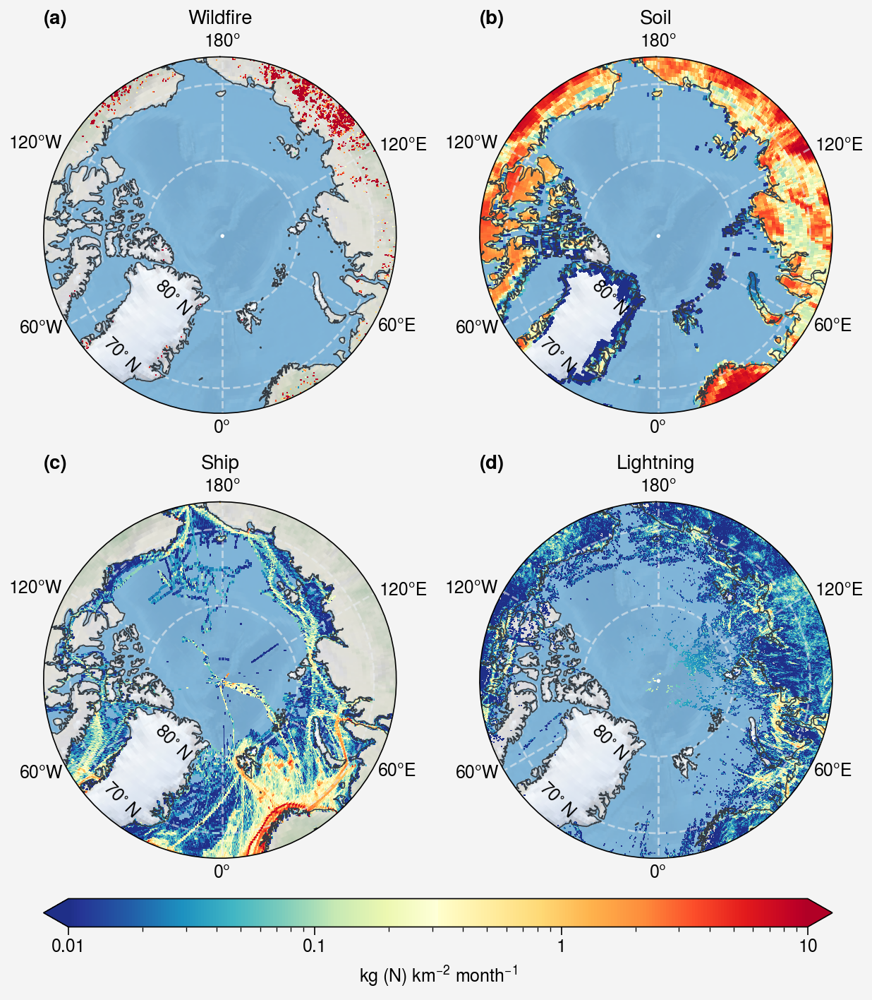

In [46]:
fig, axs = pplt.subplots(proj='npstere', nrows=2, ncols=2)

axs.format(reso='med', abc='(a)',
        latlines=10, gridcolor='gray2', gridlinewidth=1, gridalpha=0.6, gridlinestyle='--',
        lonlabels='lrbt', boundinglat=66.5,
        # landcolor='gray5', land=True,
        coast=True, coastcolor='gray8',
        )

axs.stock_img()

# wildfire
x, y =  np.meshgrid(ds_cams_fire['longitude'], ds_cams_fire['latitude'])

m = axs[0].pcolormesh(x, y, ds_cams_fire*1e6, cmap=cmap, discrete=False,
                  vmin=0.01, vmax=10,
                  # vmin=0.01, vmax=50,
                  # vmin=1e-4, vmax=0.5,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
# axs[0].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
axs[0].format(title='Wildfire')


# soil
x, y =  np.meshgrid(ds_cams_soil['lon'], ds_cams_soil['lat'])

m = axs[1].pcolormesh(x, y, ds_cams_soil*1e6, cmap=cmap, discrete=False,
                  vmin=0.01, vmax=10,
                  # vmin=5e-6, vmax=1e-4,
                  # vmin=10, vmax=3e4,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
# axs[1].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
axs[1].format(title='Soil')


# ship
x, y =  np.meshgrid(ds_cams_ship['lon'], ds_cams_ship['lat'])

m = axs[2].pcolormesh(x, y, ds_cams_ship*1e6, cmap=cmap, discrete=False,
                #   vmin=10, vmax=3e4,
                  vmin=0.01, vmax=10,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
# axs[2].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
axs[2].format(title='Ship')


# lightning
y, x =  np.meshgrid(lno2['lat'], lno2['lon'])

m = axs[3].pcolormesh(x, y, lno2*1e6, cmap=cmap, discrete=False,
                  # vmin=1e-2, vmax=0.5,
                  vmin=0.01, vmax=10,
                  # vmin=5e-6, vmax=1e-4,
                  # vmin=10, vmax=3e4,
                  extend='both',
                  cmap_kw={'left': 0.05, 'right': 0.95},
                  norm=LogNorm()
                  )
# axs[3].colorbar([m], loc='r', label='kg (N) km$^{-2}$ month$^{-1}$')
axs[3].format(title='Lightning')


fig.colorbar([m], loc='b', label='kg (N) km$^{-2}$ month$^{-1}$')

# # except anthro
# x, y =  np.meshgrid(ds_cams_anthro['lon'], ds_cams_anthro['lat'])

# m = axs[3].pcolormesh(x, y, ds_cams_anthro*1e6, cmap=cmap, discrete=False,
#                 #   vmin=1e-2, vmax=10,
#                   vmin=0.01, vmax=50,
#                   # vmin=1e-4, vmax=0.5,
#                   extend='both',
#                   cmap_kw={'left': 0.05, 'right': 0.95},
#                   norm=LogNorm()
#                   )
# axs[3].colorbar([m], loc='r', label='kg (N) km$^{-2}$')
# axs[3].format(title='Other anthropogenic sources')


axs.text(-42, 66, '70$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())
axs.text(-42, 76, '80$^{\circ}$ N', rotation=-45, transform=ccrs.PlateCarree())

fig.savefig('../figures/emission_comp.png')

## LNOx emission

In [47]:
lnox_emission = (2.4 * df_lightning.groupby(by=[df_lightning.index.year, pd.cut(df_lightning.latitude,[66.5, 70, 80, 90])])['lno2'].sum().reset_index().pivot(index='time', columns='latitude', values='lno2')* 14 / 1e6).mean(axis=0)

In [48]:
lnox_emission

latitude
(66.5, 70.0]    173.992843
(70.0, 80.0]    164.990688
(80.0, 90.0]      2.931785
dtype: float64

In [49]:
lnox_emission.sum()

341.91531635107185

In [51]:
# kg N m-2 mo-1 -> kg N mo-1
fire_emission = ds_cams_fire * area_cams_fire
soil_emission = ds_cams_soil * area_cams_soil
fire_emission = ds_cams_fire * area_cams_fire
ship_emission = ds_cams_ship * area_cams_ship

print('fire emission (kg N mo-1): ', fire_emission.sel(latitude=slice(90, 66.5)).sum().item()/1e3)
print('soil emission (kg N mo-1): ', soil_emission.sel(lat=slice(66.5, 90)).sum().item()/1e3)
print('ship emission (kg N mo-1): ', ship_emission.sel(lat=slice(90, 66.5)).sum().item()/1e3)

fire emission (kg N mo-1):  19730.42180465951
soil emission (kg N mo-1):  11726.479921767377
ship emission (kg N mo-1):  1990.0145


In [52]:
# check the proportin of lightning no2 emission in the northeast of Arctic ocean
df_lightning_high = df_lightning.loc[(df_lightning['longitude']>90)&(df_lightning['longitude']<180)&(df_lightning['latitude']>80)]

lightning_high_lno2 = df_lightning_high.groupby(by=[df_lightning_high.index.year])['lno2'].sum().mean(axis=0)* 14 / 1e6
ship_high_lno2 = ship_emission.sel(lat=slice(90, 80), lon=slice(90,180)).sum()/1e3

lightning_high_lno2/(lightning_high_lno2+ship_high_lno2)

<xarray.DataArray ()>
array(0.78462287)